In [189]:

#import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import plotly.express as px
import folium
import geopandas as gpd
from shapely.geometry import Point
import seaborn as sns

import os

Data collected from customized query here https://enviro.epa.gov/query-builder/ghg

In [190]:
# reaading in shapes of us state shapes
state_shapes = gpd.read_file('/kaggle/input/us-state-borders/tl_2012_us_state/tl_2012_us_state.dbf', include_fields=['NAME','geometry'])

In [191]:
# reading in MSW landfills waste data
waste_df = pd.read_csv('/kaggle/input/municipal-solid-waste-landfills-waste-qnty-detail/cc75441b-e4d9-4394-899d-91df0dd3e545.csv')
print(waste_df.shape)
waste_df.head()

(116443, 17)


,annual_mcf_value,decay_rate,degradable_organic_carbon_val,facility_name,fraction_of_doc_dissimilated,facility_id,is_mcf_value_default_ind,methane_fract_determ_mthd,methane_fract_annl_val,percent_by_weight,reporting_year,annl_wst_qty_sub_data_use,annl_wst_qty_num_days_sub,bulkwastetype,modifiedbulkwastetype,wastecompositiontype,year_waste_disposed
0,NaN,0,0,NORTHAMPTON LANDFILL,0,1002593,NaN,NaN,NaN,1,2015,N,NaN,Bulk waste,NaN,NaN,2010
1,1,0,0,ARLINGTON LANDFILL,0,1002645,N,DEFAULT,0,0,2012,N,NaN,NaN,NaN,textiles,2012
2,NaN,0,0,ADS-CEDAR HILL LANDFILL,0,1001633,NaN,NaN,NaN,0,2014,N,NaN,NaN,bulk C&D waste,NaN,2011
3,NaN,0,0,MISSOULA LANDFILL,0,1004013,NaN,NaN,NaN,0,2020,N,NaN,NaN,inerts,NaN,2011
4,NaN,0,0,OAK GROVE LANDFILL,0,1007990,NaN,NaN,NaN,1,2021,N,NaN,Bulk waste,NaN,NaN,2021


In [192]:

waste_df.isna().sum()

annual_mcf_value                 102995
decay_rate                          530
degradable_organic_carbon_val       502
facility_name                         0
fraction_of_doc_dissimilated        503
facility_id                           0
is_mcf_value_default_ind         102693
methane_fract_determ_mthd        102691
methane_fract_annl_val           102995
percent_by_weight                   490
reporting_year                        0
annl_wst_qty_sub_data_use           338
annl_wst_qty_num_days_sub        116267
bulkwastetype                     80424
modifiedbulkwastetype             91388
wastecompositiontype              61446
year_waste_disposed                   0
dtype: int64

In [193]:
waste_df.year_waste_disposed.value_counts()

year_waste_disposed
2010    17727
2011    17041
2012    15525
2013    13033
2014    11677
2015    10189
2016     8836
2017     7417
2018     6034
2019     4449
2020     3005
2021     1510
Name: count, dtype: int64

In [194]:
waste_df.wastecompositiontype.value_counts()

wastecompositiontype
bulk waste        26101
inerts            22620
sewage sludge      1076
wood and straw     1042
garden              971
food waste          835
textiles            834
diapers             762
paper               756
Name: count, dtype: int64

In [195]:
waste_df.describe()

,annual_mcf_value,decay_rate,degradable_organic_carbon_val,fraction_of_doc_dissimilated,facility_id,methane_fract_annl_val,percent_by_weight,reporting_year,annl_wst_qty_num_days_sub,year_waste_disposed
count,13448,115913,115941,115940,116443,13448,115953,116443,176,116443
mean,1,0,0,0,1005380,0,1,2017,9,2014
std,0,0,0,0,2446,0,0,3,24,3
min,0,0,0,0,1000010,0,0,2010,0,2010
25%,1,0,0,0,1003460,0,0,2015,0,2011
50%,1,0,0,0,1005266,0,1,2018,0,2013
75%,1,0,0,0,1007610,0,1,2020,1,2016
max,1,1,1,0,1014391,1,1,2021,90,2021


In [196]:
methane_fracs_df = waste_df[waste_df['methane_fract_annl_val'].notna()]
methane_fracs_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13448 entries, 1 to 116436
Data columns (total 17 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   annual_mcf_value               13448 non-null  float64
 1   decay_rate                     13424 non-null  float64
 2   degradable_organic_carbon_val  13434 non-null  float64
 3   facility_name                  13448 non-null  object 
 4   fraction_of_doc_dissimilated   13448 non-null  float64
 5   facility_id                    13448 non-null  int64  
 6   is_mcf_value_default_ind       13446 non-null  object 
 7   methane_fract_determ_mthd      13448 non-null  object 
 8   methane_fract_annl_val         13448 non-null  float64
 9   percent_by_weight              13446 non-null  float64
 10  reporting_year                 13448 non-null  int64  
 11  annl_wst_qty_sub_data_use      13448 non-null  object 
 12  annl_wst_qty_num_days_sub      5 non-null      flo

In [197]:
fig = px.box(methane_fracs_df, title='Produced Methane by Waste Type', x='wastecompositiontype', y='methane_fract_annl_val', color='wastecompositiontype')
fig.update_layout(title_x=0.5, xaxis_title='Waste Type', yaxis_title='Methane Fraction Value', legend_title='Waste Type')
fig.show()

In [198]:
main_emitters_gdf = gpd.read_file('/kaggle/input/ghg-emitters-epa/f33bc64c-fdfb-481c-81e1-0eb22add2c1b.csv', include_fields=['co2e_emission','facility_id','gas_code','gas_name','latitude','longitude','state_name'])
main_emitters_gdf.head()

,co2e_emission,gas_code,gas_name,facility_id,latitude,longitude,state_name,geometry
0,138.25,CH4,Methane,1000001,48.828707,-122.685533,WASHINGTON,None
1,292987.9,CO2,Carbon Dioxide,1000001,48.828707,-122.685533,WASHINGTON,None
2,164.794,N2O,Nitrous Oxide,1000001,48.828707,-122.685533,WASHINGTON,None
3,17.0,CH4,Methane,1000001,48.828707,-122.685533,WASHINGTON,None
4,35840.9,CO2,Carbon Dioxide,1000001,48.828707,-122.685533,WASHINGTON,None


In [199]:
main_emitters_gdf.facility_id = main_emitters_gdf.facility_id.astype(int)

In [200]:
merged_df = methane_fracs_df.merge(main_emitters_gdf, on='facility_id', how='right')

In [201]:
merged_df.longitude = merged_df.longitude.astype(float)
merged_df.latitude = merged_df.latitude.astype(float)


In [202]:
geometry = [Point(xy) for xy in zip(merged_df.longitude, merged_df.latitude)]
df = merged_df.drop(['longitude', 'latitude'], axis=1)
merged_gdf = gpd.GeoDataFrame(df, crs="EPSG:4326", geometry=geometry)

merged_gdf.head()

,annual_mcf_value,decay_rate,degradable_organic_carbon_val,facility_name,fraction_of_doc_dissimilated,facility_id,is_mcf_value_default_ind,methane_fract_determ_mthd,methane_fract_annl_val,percent_by_weight,...,annl_wst_qty_num_days_sub,bulkwastetype,modifiedbulkwastetype,wastecompositiontype,year_waste_disposed,co2e_emission,gas_code,gas_name,state_name,geometry
0,NaN,NaN,NaN,NaN,NaN,1000001,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,138.25,CH4,Methane,WASHINGTON,POINT (-122.68553 48.82871)
1,NaN,NaN,NaN,NaN,NaN,1000001,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,292987.9,CO2,Carbon Dioxide,WASHINGTON,POINT (-122.68553 48.82871)
2,NaN,NaN,NaN,NaN,NaN,1000001,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,164.794,N2O,Nitrous Oxide,WASHINGTON,POINT (-122.68553 48.82871)
3,NaN,NaN,NaN,NaN,NaN,1000001,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,17.0,CH4,Methane,WASHINGTON,POINT (-122.68553 48.82871)
4,NaN,NaN,NaN,NaN,NaN,1000001,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,35840.9,CO2,Carbon Dioxide,WASHINGTON,POINT (-122.68553 48.82871)


In [203]:
minnesota_shape = state_shapes.loc[state_shapes['NAME'] == 'Minnesota']
minnesota_shape

,NAME,geometry
43,Minnesota,"POLYGON ((-10737141.426 5469123.028, -10737144..."


In [204]:
minnesota_shape = minnesota_shape.to_crs(4326)
mn_emitters_gdf = gpd.sjoin(merged_gdf, minnesota_shape)

In [205]:
mn_emitters_gdf.facility_name.value_counts()

facility_name
PINE BEND LANDFILL                              864
ELK RIVER SANITARY LANDFILL, INC.               720
SPRUCE RIDGE RESOURCE MGMT FACILITY             720
BURNSVILLE SANITARY LANDFILL                    705
ADVANCED DISPOSAL ROLLING HILLS LANDFILL INC    264
RICE COUNTY LANDFILL                            234
CROW WING COUNTY MMSW LANDFILL                  192
MORRISON COUNTY LANDFILL                        156
PONDEROSA LANDFILL/BLUE EARTH COUNTY            154
EAST CENTRAL SOLID WASTE COMMISSION             120
LYON COUNTY                                     102
OLMSTED COUNTY - KALMAR LANDFILL                 42
Name: count, dtype: int64

Below is an interactive folium map with points plotted at each facility with a reported gas emission, hovering over the point will display the C02 equivalent of the emissions, and facility id and gas code.

In [206]:

minnesota_center = Point(94.6859,46.7296 )

m = folium.Map(location = (46.7296, -94.6859), zoom_start=6)

mn_emitters_gdf.explore(m=m, column='gas_code', cmap='viridis_r', tooltip=['gas_code','facility_id','co2e_emission'],marker_type='circle_marker', marker_kwds={'radius':6,'opacity':0.3})
folium.LayerControl().add_to(m)
m

In [207]:
counties = gpd.read_file('/kaggle/input/us-counties-shapefiles/c_08mr23/c_08mr23.dbf')
counties.head()

,STATE,CWA,COUNTYNAME,FIPS,TIME_ZONE,FE_AREA,LON,LAT,geometry
0,ME,CAR,Washington,23029,E,se,-68,45,"MULTIPOLYGON (((-67.93539 44.40382, -67.93643 ..."
1,GA,CHS,McIntosh,13191,E,se,-81,32,"MULTIPOLYGON (((-81.46814 31.33980, -81.46747 ..."
2,GA,CHS,Liberty,13179,E,se,-81,32,"POLYGON ((-81.30807 31.79454, -81.30546 31.791..."
3,AS,PPG,Swains Island,60040,S,None,-171,-11,"POLYGON ((-171.07475 -11.05295, -171.07366 -11..."
4,AS,PPG,Manu'a,60020,S,None,-170,-14,"MULTIPOLYGON (((-169.60973 -14.15779, -169.609..."


In [208]:
"""geometry = [Point(xy) for xy in zip(minnesota_emissions_counties.LON, minnesota_emissions_counties.LAT)]
minnesota_emissions_counties = minnesota_emissions_counties.drop(['LON', 'LAT'], axis=1)"""

"geometry = [Point(xy) for xy in zip(minnesota_emissions_counties.LON, minnesota_emissions_counties.LAT)]\nminnesota_emissions_counties = minnesota_emissions_counties.drop(['LON', 'LAT'], axis=1)"

In [209]:
mn_emitters_gdf.head()

,annual_mcf_value,decay_rate,degradable_organic_carbon_val,facility_name,fraction_of_doc_dissimilated,facility_id,is_mcf_value_default_ind,methane_fract_determ_mthd,methane_fract_annl_val,percent_by_weight,...,modifiedbulkwastetype,wastecompositiontype,year_waste_disposed,co2e_emission,gas_code,gas_name,state_name,geometry,index_right,NAME
4565,NaN,NaN,NaN,NaN,NaN,1000118,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,12.25,CH4,Methane,MINNESOTA,POINT (-95.12970 47.54440),43,Minnesota
4566,NaN,NaN,NaN,NaN,NaN,1000118,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,26678.4,CO2,Carbon Dioxide,MINNESOTA,POINT (-95.12970 47.54440),43,Minnesota
4567,NaN,NaN,NaN,NaN,NaN,1000118,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,14.602,N2O,Nitrous Oxide,MINNESOTA,POINT (-95.12970 47.54440),43,Minnesota
4568,NaN,NaN,NaN,NaN,NaN,1000118,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,9.0,CH4,Methane,MINNESOTA,POINT (-95.12970 47.54440),43,Minnesota
4569,NaN,NaN,NaN,NaN,NaN,1000118,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,19290.4,CO2,Carbon Dioxide,MINNESOTA,POINT (-95.12970 47.54440),43,Minnesota


In [210]:
mn_emitters_gdf = mn_emitters_gdf.drop(columns='index_right', axis=1)

In [211]:

mn_counties.geometry = mn_counties.geometry.to_crs(4326)
minnesota_emissions_counties = mn_emitters_gdf.sjoin(mn_counties, how='right')

Displaying the list of Minnesota counties by order of total co2 equivalent emissions.

In [212]:
pd.options.display.float_format = '{:.0f}'.format
minnesota_emissions_counties['co2e_emission'] = minnesota_emissions_counties['co2e_emission'].astype('float')
minnesota_emissions_counties.groupby('COUNTYNAME')['co2e_emission'].sum().sort_values(ascending=False)

COUNTYNAME
Sherburne         157932073
Dakota            116300060
Itasca             88358740
Washington         43969992
St. Louis          43670539
                     ...   
Nicollet                  0
Pennington                0
Pine                      0
Pipestone                 0
Yellow Medicine           0
Name: co2e_emission, Length: 87, dtype: float64

In [213]:
minnesota_emissions_counties.geometry.value_counts()

geometry
POLYGON ((-93.09100 44.92211, -93.08939 44.919...    1779
POLYGON ((-93.82150 45.56001, -93.80070 45.559...     813
POLYGON ((-94.40690 44.97871, -94.39909 44.978...     786
POLYGON ((-93.51250 45.24591, -93.50459 45.242...     679
MULTIPOLYGON (((-92.08009 46.75804, -92.08339 ...     473
                                                     ... 
POLYGON ((-94.03999 47.41781, -94.03750 47.415...       1
POLYGON ((-93.65400 47.02891, -93.62560 47.029...       1
POLYGON ((-95.16920 47.15251, -95.16910 47.137...       1
POLYGON ((-91.85909 44.19321, -91.85619 44.192...       1
POLYGON ((-92.88699 46.41911, -92.87520 46.418...       1
Name: count, Length: 87, dtype: int64

In [214]:
#fig = px.choropleth_mapbox(data_frame=minnesota_emissions_counties, geojson=minnesota_emissions_counties.geometry, color='co2e_emission', center={'lat':46.7296,'lon':-94.6859 }, mapbox_style="carto-positron")
#fig.update_geos(fitbounds="locations", visible=False)

#fig.show()

In [215]:
gas_collection_sys = pd.read_csv('/kaggle/input/hh-gas-collection-system-details/276ce148-6065-48d4-9cef-315ba3c58b66.csv')
gas_collection_sys.head()

,annl_avg_methane_concentration,gcs_annual_operating_hours,annual_qty_recoverd_ch4_eq_hh4,annual_landfill_gas_flow,ch4_gen_input_to_equation_hh6,ch4_destruction_location,equation_hh6_result,equation_hh8_result,equation_hh5_result,equation_hh7_result,est_gas_collection_efficiency,facility_name,facility_id,is_temperature_incorporated,number_of_wells,primary_destr_device_ann_op_hr,reporting_year,gas_collection_system_capacity
0,43,8613,6357,776325168,EQUATION HH-4,ON-SITE,64,356,4011,5105,1,CRAZY HORSE SANITARY LANDFILL,1004419,Y,130,NaN,2013,25000
1,52,NaN,5485,550696100,EQUATION HH-1,ON-SITE,2344,278,6403,4371,1,LAKE LANDFILL,1003588,Y,96,NaN,2021,3200
2,52,8736,3548,352605200,EQUATION HH-1,ON-SITE,1643,5458,4765,8581,0,JEFFERSON COUNTY LANDFILL,1003615,Y,26,NaN,2015,2000
3,54,8751,12662,1211091300,EQUATION HH-4,ON-SITE,127,2305,8493,11674,1,ROLLING MEADOWS LANDFILL,1007832,Y,74,NaN,2016,5100
4,54,NaN,4100,417332312,EQUATION HH-1,ON-SITE,5891,1774,9581,5464,1,TOA BAJA LANDFILL,1005166,Y,100,NaN,2020,1500


In [216]:
gas_collection_sys.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10489 entries, 0 to 10488
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   annl_avg_methane_concentration  10484 non-null  float64
 1   gcs_annual_operating_hours      4863 non-null   float64
 2   annual_qty_recoverd_ch4_eq_hh4  10465 non-null  float64
 3   annual_landfill_gas_flow        10487 non-null  float64
 4   ch4_gen_input_to_equation_hh6   10481 non-null  object 
 5   ch4_destruction_location        10478 non-null  object 
 6   equation_hh6_result             10480 non-null  float64
 7   equation_hh8_result             10475 non-null  float64
 8   equation_hh5_result             10484 non-null  float64
 9   equation_hh7_result             10474 non-null  float64
 10  est_gas_collection_efficiency   10468 non-null  float64
 11  facility_name                   10489 non-null  object 
 12  facility_id                     

In [217]:
gas_collection_sys.describe()

,annl_avg_methane_concentration,gcs_annual_operating_hours,annual_qty_recoverd_ch4_eq_hh4,annual_landfill_gas_flow,equation_hh6_result,equation_hh8_result,equation_hh5_result,equation_hh7_result,est_gas_collection_efficiency,facility_id,number_of_wells,primary_destr_device_ann_op_hr,reporting_year,gas_collection_system_capacity
count,10484,4863,10465,10487,10480,10475,10484,10474,10468,10489,10489,2572,10489,10489
mean,47,8262,7156,769539414,4650,2552,10611,8625,1,1005301,108,8138,2015,100981
std,8,1284,9056,1006468819,6586,3353,11948,10166,0,2304,152,3642,3,7255304
min,0,0,0,0,0,0,0,0,0,1000010,0,0,2010,37
25%,43,8435,1785,201556080,1083,638,3498,2508,1,1003560,44,8000,2012,1362
50%,49,8680,4165,446533300,2639,1558,6710,5348,1,1005214,77,8585,2015,2500
75%,52,8754,8977,938921013,5413,3215,12936,10724,1,1007298,128,8737,2018,4500
max,99,8784,119190,16489883712,87697,70938,115318,123300,1,1014304,8760,52970,2021,638838089


In [218]:
ch4_equations = gas_collection_sys[['equation_hh6_result','equation_hh8_result','equation_hh5_result','equation_hh7_result','reporting_year']]
ch4_equations.describe()

,equation_hh6_result,equation_hh8_result,equation_hh5_result,equation_hh7_result,reporting_year
count,10480,10475,10484,10474,10489
mean,4650,2552,10611,8625,2015
std,6586,3353,11948,10166,3
min,0,0,0,0,2010
25%,1083,638,3498,2508,2012
50%,2639,1558,6710,5348,2015
75%,5413,3215,12936,10724,2018
max,87697,70938,115318,123300,2021


<Axes: title={'center': 'equation_hh6_result'}, xlabel='reporting_year'>

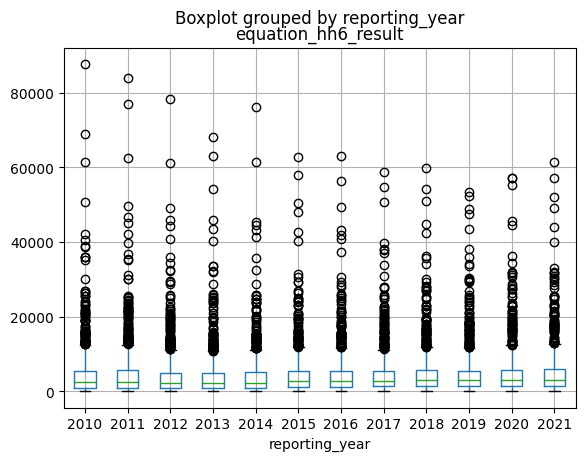

In [219]:
ch4_equations.boxplot(column='equation_hh6_result', by='reporting_year')